# <u>Social Media Analytics Capstone Project</u>  

<u>Submitted To</u>: <b>Prof. Dr. Tillmann Schwörer</b>

<u>Submitted By</u>: <b>Khushi Kala</b>

## Task 1: Project's Description


- Goal : Stock Market Price Prediction through Financial Sentiment Analysis.

    1. In this project I am going to perform the Text Analysis of Tweets for Stocks and predict the pricing on the basis of sentiment analysis. Also, I will perform the analysis for trend prediction in the market according to the sentiment. Stock price prediction involves various strategies, but the emotions also plays a very vital role and it has been observed from past data that the sentiment of an investor vary the pricing of stocks. Thus we will be looking forward to the Text Analysis for retreiving the pricing and evaluating the prediction model. Evalutating the sentiment on the basis of some top words or phrases or any other combination of sentiments be it showing a Bullish Market (buying is more)or a Bearish Market (Selling is more) is one of the main task of this Project. Tweeter(Now X) is a platform to share the small thoughts or interests towards a topic. It has became a very large anaylsing platform to understand the Human Support over a certain ongoing market situation. With these comments many investors can take an analysis over market and then perform their investing, which further reflects strongly in Stock Price. For an example in the current Market situation of AI Boom, Nvidia the Chip Maker company became the most valuable one surpassing Microsoft and Apple. These are the examples of how a certain technological advancement brings out a large difference in Market Price and also affects sentiments of people.

    2. The Dataset has been taken from Kaggle: https://www.kaggle.com/datasets/equinxx/stock-tweets-for-sentiment-analysis-and-prediction?select=stock_tweets.csv

    3. The Dataset consist of two different CSV Files in which one consists of Tweets for 25 most watched stocks from 30-09-2021 to 30-09-2022. More details regarding the dataset is given in section 2 of this notebook.

    4. The challenge for this project is based on mainly Text Analysis and then building a model for prediction.

- Purpose :  By leveraging sentiment analysis and natural language processing (NLP) techniques, the project aims to determine if there is a correlation between the sentiment of tweets and subsequent stock price changes and to further predict the stock prices. The main idea behind this project is to highlight the importance of emotions that typically affect the stock market and to understand how to uncover hidden patterns between sentiments and financial outcomes.

- Use-Case: Investors can then get the information regarding the Stock Market according to the Social Media Comments or Tweets which can help them to make informed decisions or accurate decisions at a certain level. It can also help them to make decision in addition to the fundamental and technical skills of share market.

## Task 2: Data Loading and Reading

<b> Importing Libraries</b>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
import contractions
import seaborn as sns
from nltk.tokenize import word_tokenize
import nltk
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')
from sklearn.ensemble import RandomForestClassifier
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from transformers import pipeline
import spacy
from sklearn.model_selection import   GridSearchCV,  train_test_split
nltk.download('vader_lexicon')
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, precision_score
import math
import plotly.graph_objects as go
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Asus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Asus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Asus\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Asus\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


<b> Loading Data and Reading Data</b>

In [2]:
stocks_tweets_df = pd.read_csv('stock_tweets.csv')
stocks_pricing_df = pd.read_csv('stock_yfinance_data.csv')
stocks_tweets_df.head()

,Date,Tweet,Stock Name,Company Name
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc."
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc."
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc."
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc."
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc."


Dataset Explanation of Stocks Tweet Dataframe

1. Stocks Tweets Dataset consist of 4 Columns : Date, Tweet, Stock name and Company name.
2. Date columns also consists of Time Data
3. Tweet Column consists of tweet posted by a user at that date and time.
4. Stock colum is mainly the Stock Symbol of the Company
5. Company column is the full company name of the stock
6. In further section 3 we will look forward to the characteristics of this dataset.

In [4]:
#reading data
stocks_pricing_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA


Dataset Explanation of Stock y_finance :

1. This dataset has been taken from Yahoo Finance mentioned in the Kaggle Source
2. It consists of 8 columns
3. The columns are Date, Open, high, Low, Close, Adj close, Volume and Stock Name
4. Date column depicts the date price of that stock
5. Open column is Open Price for the corresponding date
6. High Column is High Price for the corresponding date
7. Low column is Low Price for the corresponding date
8. Close column is Close Price for the corresponding date
9. Adj Close Column is Adjusted CLose Price for the corresponding date
10. Volume is the Volume of shares on that date
11. Stock Name is the Stock Symbol of a company.

<b> Suitability of Dataset for this Project</b>

This Datast proves out to be very suitable for our case of the project, since it consists of price of stocks and also tweets posted on that date. Our main goal is to find the pattern from Tweets and Predict the pricing of the Shares on a particular date and both the Dataframe contain this information which we can use to build a model.

Using the tweets data for a particular stock can help us to determine the affect of sentiments on that Company Share Price.

## Task 3: Initial Data Analysis

Shape of Data

In [7]:
print(f"The number of rows present in stock tweets dataset are {stocks_tweets_df.shape[0]}")
print(f"The number of cols present in stock tweets dataset are {stocks_tweets_df.shape[1]}")

print(f"The number of rows present in stock pricing  dataset are {stocks_pricing_df.shape[0]}")
print(f"The number of cols present in stock pricing  dataset are {stocks_pricing_df.shape[1]}")

The number of rows present in stock tweets dataset are 80793
The number of cols present in stock tweets dataset are 4
The number of rows present in stock pricing  dataset are 6300
The number of cols present in stock pricing  dataset are 8


Null Value check

In [8]:
null_tweet_values = stocks_tweets_df.isnull().sum()
print(null_tweet_values)

Date            0
Tweet           0
Stock Name      0
Company Name    0
dtype: int64


In [9]:
null_pricing_value = stocks_pricing_df.isnull().sum()
print(null_pricing_value)

Date          0
Open          0
High          0
Low           0
Close         0
Adj Close     0
Volume        0
Stock Name    0
dtype: int64


Observations:

1. No Null Values are present in both the Datasets

 Duplicate Value Check

In [10]:
duplicate_tweets_rows = stocks_tweets_df.duplicated().sum()
print("Number of duplicate rows: ", duplicate_tweets_rows)

Number of duplicate rows:  0


In [11]:
duplicate_pricing_rows = stocks_pricing_df.duplicated().sum()
print("Number of duplicate rows: ", duplicate_pricing_rows)

Number of duplicate rows:  0


Observations:

1. No Duplicate Values are present in both the datasets

 Data Types of Features

In [3]:
#convertinf date type
stocks_tweets_df['Date'] = pd.to_datetime(stocks_tweets_df['Date'])
print(f"Data Type of Tweets Dataframe {stocks_tweets_df.dtypes}")

Data Type of Tweets Dataframe Date            datetime64[ns, UTC]
Tweet                        object
Stock Name                   object
Company Name                 object
dtype: object


In [4]:
#converting to date type
stocks_pricing_df['Date'] = pd.to_datetime(stocks_pricing_df['Date'])
print(f"Data Type of Pricimg Dataframe {stocks_pricing_df.dtypes}")

Data Type of Pricimg Dataframe Date          datetime64[ns]
Open                 float64
High                 float64
Low                  float64
Close                float64
Adj Close            float64
Volume                 int64
Stock Name            object
dtype: object


Observation:

All features are numerival except the last stock name, thus data types are float

 Unique Values

In [14]:
unique_values_tweets = {}
for col in stocks_tweets_df.columns:
    unique_values_tweets[col] = stocks_tweets_df[col].value_counts().shape[0]

pd.DataFrame(unique_values_tweets, index=['unique value count Tweets']).transpose()

,unique value count Tweets
Date,64424
Tweet,64479
Stock Name,25
Company Name,25


Observations:

Since our dataset consists of 25 Companies data as mentioned in first section total unique values in Stock name and Company Name columns are 25.

In [15]:
unique_values_pricing = {}
for col in stocks_pricing_df.columns:
    unique_values_pricing[col] = stocks_pricing_df[col].value_counts().shape[0]

pd.DataFrame(unique_values_pricing, index=['unique value count pricing']).transpose()

,unique value count pricing
Date,252
Open,5673
High,5736
Low,5767
Close,5731
Adj Close,6048
Volume,6245
Stock Name,25


Observations:

Since all columns are numerical value so there may or may not be a possibility of unique value, but again Stock Name consists of 25 unique values.

Statistical information of Dataset

In [27]:
stocks_pricing_df.describe()

,Date,Open,High,Low,Close,Adj Close,Volume,year,month
count,6300,6300.000000,6300.000000,6300.000000,6300.000000,6300.000000,6.300000e+03,6300.000000,6300.000000
mean,2022-03-31 02:45:42.857143040,174.748195,177.594589,171.734715,174.657624,173.756012,2.906806e+07,2021.742063,6.571429
min,2021-09-30 00:00:00,11.050000,11.210000,10.610000,11.060000,10.837500,3.078000e+05,2021.000000,1.000000
25%,2021-12-29 18:00:00,78.170002,79.891003,76.792501,78.110001,78.110001,5.857700e+06,2021.000000,4.000000
50%,2022-03-30 12:00:00,145.475128,147.475006,143.501251,145.505005,144.248146,1.518830e+07,2022.000000,7.000000
75%,2022-06-30 06:00:00,225.665001,230.662498,221.452496,225.785000,225.785000,4.122928e+07,2022.000000,10.000000
max,2022-09-29 00:00:00,692.349976,700.989990,686.090027,691.690002,691.690002,3.116452e+08,2022.000000,12.000000
std,NaN,134.989675,136.795419,133.049955,134.949601,134.582934,3.342181e+07,0.437534,3.441223


Observations:

1. It tells about the highest, lowest and average numerical value.

Making Two columns of Data and Time separately

In [5]:
stocks_tweets_df['Time'] = stocks_tweets_df['Date'].dt.time
stocks_tweets_df['Date'] = stocks_tweets_df['Date'].dt.date
stocks_tweets_df['Date'] = pd.to_datetime(stocks_tweets_df['Date'])


Finding the Range

In [19]:
print(f"The Dataset is consists of information from {np.min(stocks_pricing_df['Date'])} to {np.max(stocks_pricing_df['Date'])}")

The Dataset is consists of information from 2021-09-30 00:00:00 to 2022-09-29 00:00:00


 Stocks Names

In [20]:
print(f"The 25 stock symbols are {stocks_tweets_df['Stock Name'].unique()}")

The 25 stock symbols are ['TSLA' 'MSFT' 'PG' 'META' 'AMZN' 'GOOG' 'AMD' 'AAPL' 'NFLX' 'TSM' 'KO'
 'F' 'COST' 'DIS' 'VZ' 'CRM' 'INTC' 'BA' 'BX' 'NOC' 'PYPL' 'ENPH' 'NIO'
 'ZS' 'XPEV']


In [21]:
print(f"The 25 companies names are {stocks_tweets_df['Company Name'].unique()}")

The 25 companies names are ['Tesla, Inc.' 'Microsoft Corporation' 'Procter & Gamble Company'
 'Meta Platforms, Inc.' 'Amazon.com, Inc.' 'Alphabet Inc.'
 'Advanced Micro Devices, Inc.' 'Apple Inc.' 'Netflix, Inc.'
 'Taiwan Semiconductor Manufacturing Company Limited'
 'The Coca-Cola Company' 'Ford Motor Company'
 'Costco Wholesale Corporation' 'The Walt Disney Company'
 'Verizon Communications Inc.' 'Salesforce, Inc.' 'Intel Corporation'
 'The Boeing Company' 'Blackstone Inc.' 'Northrop Grumman Corporation'
 'PayPal Holdings, Inc.' 'Enphase Energy, Inc.' 'NIO Inc.' 'Zscaler, Inc.'
 'XPeng Inc.']


In [6]:
#extracting month and year
stocks_pricing_df['year'] = stocks_pricing_df['Date'].dt.year
stocks_pricing_df['month'] = stocks_pricing_df['Date'].dt.month
stocks_pricing_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,year,month
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,2021,9
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA,2021,10
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA,2021,10
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA,2021,10
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA,2021,10


Merging the Dataset into one Final dataset

In [7]:
stocks_pricing_df['Date'] = pd.to_datetime(stocks_pricing_df['Date'])
stocks_tweets_df['Date'] = pd.to_datetime(stocks_tweets_df['Date'])

In [8]:
stocks_final =  pd.merge(stocks_tweets_df, stocks_pricing_df, on=['Date','Stock Name'], how='left')
stocks_final.rename(columns= {'Stock Name': 'Symbol'}, inplace=True)
stocks_final.head()

,Date,Tweet,Symbol,Company Name,Time,Open,High,Low,Close,Adj Close,Volume,year,month
0,2022-09-29,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",23:41:16,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",23:24:43,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",23:18:08,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",22:40:07,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",22:27:05,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0


 Top 3 closing Price with companies

In [25]:
top3_stock_price = stocks_final.groupby('Symbol')['Close'].max()
top3_stock_price.sort_values(ascending=False).head(3)

Symbol
NFLX    691.690002
COST    608.049988
NOC     492.510010
Name: Close, dtype: float64

Top 20 Company with Most Frequent Tweets

In [26]:
top20_tweets_cmpy = stocks_final.groupby('Symbol')['Tweet'].count()
top20_tweets_cmpy.sort_values(ascending=False).head(20)

Symbol
TSLA    37422
TSM     11034
AAPL     5056
AMZN     4089
PG       4089
MSFT     4089
NIO      3021
META     2751
AMD      2227
NFLX     1727
GOOG     1291
PYPL      843
DIS       635
BA        399
COST      393
INTC      315
KO        310
CRM       233
XPEV      225
ENPH      216
Name: Tweet, dtype: int64

 Top 20 Hashtags

In [35]:
# Function to extract hashtags from text
def extract_hashtags(text):
    return re.findall(r'#\w+', text)

# Apply the function to the DataFrame
stocks_tweets_df['Hashtags'] = stocks_tweets_df['Tweet'].apply(extract_hashtags)

# Flatten the list of hashtags
all_hashtags = [hashtag for sublist in stocks_tweets_df['Hashtags'] for hashtag in sublist]

hashtag_counts = Counter(all_hashtags)

top_20_hashtags = hashtag_counts.most_common(20)

# Display the top 20 hashtags
print("Top 20 Hashtags:")
for hashtag, count in top_20_hashtags:
    print(f"{hashtag}: {count}")

Top 20 Hashtags:
#Tesla: 2366
#tesla: 481
#TSLA: 391
#Bitcoin: 361
#TeslaStock: 284
#ElonMusk: 278
#stickynote: 255
#MarketOutlook: 254
#TSMWIN: 248
#TSM: 242
#1: 229
#stocks: 229
#LottoFriday: 226
#OPTIONS: 225
#FSDBeta: 196
#LCS: 186
#bitcoin: 180
#AMZN: 168
#EV: 147
#btc: 143


## Task 4: EDA/ Data Engineering/ Text Preprocessing

In [11]:
# Only Taking TSLA Share
stocks_final_tsla = stocks_final[stocks_final['Symbol'] == 'TSLA']
stocks_final_tsla.head()

,Date,Tweet,Symbol,Company Name,Time,Open,High,Low,Close,Adj Close,Volume,year,month
0,2022-09-29,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",23:41:16,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",23:24:43,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",23:18:08,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",22:40:07,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",22:27:05,282.76001,283.649994,265.779999,268.209991,268.209991,77620600.0,2022.0,9.0


In [12]:
stocks_final_tsla = stocks_final_tsla[['Date', 'Tweet', 'Symbol', 'Company Name','Time', 'Open', 'High', 'Low', 'Close', 'Volume']]
stocks_final_tsla.shape

(37422, 10)

<b> Visualization</b>

 Tesla Share Volume Graph

In [13]:
fig = go.Figure([go.Bar(x= stocks_final_tsla['Date'], y= stocks_final_tsla['Volume'], marker_color='red')])
fig.update_layout(title='Tesla Stock Trading Volume Over Time', xaxis_title='Date', yaxis_title='Volume', )
fig.show()

<b> TSLA Share Candelstick chart</b>

In [14]:
fig = go.Figure(data=[go.Candlestick(x=stocks_final_tsla['Date'],
                                     open=stocks_final_tsla['Open'],
                                     high=stocks_final_tsla['High'],
                                     low=stocks_final_tsla['Low'],
                                     close=stocks_final_tsla['Close'],
                                     increasing_line_color='green',
                                     decreasing_line_color='red')])
fig.update_layout(title='Candlestick Chart', xaxis_title='Date', yaxis_title='Price')
fig.show()

<b>Tesla Area Chart of Closing Prices</b>

In [15]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=stocks_final_tsla['Date'], y=stocks_final_tsla['Close'], fill='tozeroy', name='Close', line=dict(color='blue'), fillcolor='lightblue'))
fig.update_layout(title='Area Chart of TSLA Stock Closing Prices', xaxis_title='Date', yaxis_title='Close Price')
fig.show()

### Converting to Lower Case

In [46]:
#working on this dataset then will merge later
tweets_dataset = stocks_final_tsla[['Symbol', 'Date', 'Tweet']]
tweets_dataset.head()

,Symbol,Date,Tweet
0,TSLA,2022-09-29,Mainstream media has done an amazing job at br...
1,TSLA,2022-09-29,Tesla delivery estimates are at around 364k fr...
2,TSLA,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...
3,TSLA,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...
4,TSLA,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,..."


In [ ]:
#lower
tweets_dataset['Tweet'] = tweets_dataset['Tweet'].str.lower()

### Removing unnecessary space

In [47]:
def remove_space(text):
 text =  re.sub(r'\s+', ' ', text)
 return text

tweets_dataset['Tweet'] = tweets_dataset['Tweet'].apply(remove_space)

### Removing URLs

In [48]:
def remove_urls(text):
    # Use regex to remove URLs from the text
    text = re.sub(r'http\S+|www.\S+', '', text)
    return text

tweets_dataset['Tweet'] = tweets_dataset['Tweet'].apply(remove_urls)

### Removing Special Characters

In [49]:
def remove_special_characters(text):
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    return text

tweets_dataset['Tweet'] = tweets_dataset['Tweet'].apply(remove_special_characters)

### Expand Contractions

In [50]:
def expand_contractions(text):
    return contractions.fix(text)

tweets_dataset['Tweet'] = tweets_dataset['Tweet'].apply(expand_contractions)

### Removing  Duplicates

In [51]:
tweets_dataset.drop_duplicates(inplace=True)

### Tokenization

In [52]:
def create_tokens(text):
    return word_tokenize(text)

tweets_dataset['tweet_tokens'] = tweets_dataset['Tweet'].apply(create_tokens)

### Remove Unuseful

In [53]:
english_words = set(nltk.corpus.words.words())
def remove_gibberish(tokens):
    cleaned_tokens = [token for token in tokens if token.lower() in english_words]
    return cleaned_tokens
tweets_dataset['tweet_tokens'] = tweets_dataset['tweet_tokens'].apply(remove_gibberish)

### Stop Word Removal

In [54]:
def remove_stopwords(tokens):
    stop_words = set(stopwords.words('english'))
    filtered_words = [token for token in tokens if token not in stop_words]
    return ' '.join(filtered_words)

tweets_dataset['Tweet'] = tweets_dataset['tweet_tokens'].apply(remove_stopwords)
tweets_dataset.head()

,Symbol,Date,Tweet,tweet_tokens
0,TSLA,2022-09-29,media done amazing job brainwashing people Tod...,"[media, done, an, amazing, job, at, brainwashi..."
1,TSLA,2022-09-29,delivery around,"[delivery, are, at, around, from, the]"
2,TSLA,2022-09-29,Even I include unvested additional equity x If...,"[Even, if, I, include, unvested, as, of, addit..."
3,TSLA,2022-09-29,still trying stop Get together make something ...,"[why, are, you, still, trying, to, stop, Get, ..."
4,TSLA,2022-09-29,Stop trying kill sad deranged old man,"[Stop, trying, to, kill, you, sad, deranged, o..."


### Lemmatization

In [55]:
nlp = spacy.load("en_core_web_sm")

tweets_dataset["doc"] = list(nlp.pipe(tweets_dataset['Tweet']))


In [56]:
def lemmatize_text(text):
    lemmatized_text = ' '.join([token.lemma_ for token in text])
    return lemmatized_text

tweets_dataset['Tweet'] = tweets_dataset['doc'].apply(lemmatize_text)


### Sentiment Analysis Using VADER

To get sentiment (polarity) scores, we use VADER (Valence Aware Dictionary for Sentiment Reasoning) model. VADER is a model used for text sentiment analysis that is sensitive to both polarity (positive/negative) and intensity (strength) of emotion. It is available in the NLTK package and can be applied directly to unlabeled text data.

VADER sentimental analysis relies on a dictionary that maps lexical features to emotion intensities known as sentiment scores. The sentiment score of a text can be obtained by summing up the intensity of each word in the text.

In [77]:
def get_sentiment(sentiment_score):
     if sentiment_score >= 0.05 :
        return 'Positive'

     elif sentiment_score <= - 0.05 :
        return 'Negative'

     else :
        return 'Neutral'

In [78]:
# Sentiment analysis
analyzer = SentimentIntensityAnalyzer()
tweets_dataset['sentiment_score_vader'] = tweets_dataset['Tweet'].apply(lambda x: analyzer.polarity_scores(x)['compound'])

# Assigning Sentiment
tweets_dataset['sentiments_vader'] = tweets_dataset['sentiment_score_vader'].apply(get_sentiment)
tweets_dataset.head()

,Symbol,Date,Tweet,tweet_tokens,doc,sentiment_score_vader,sentiments_vader
0,TSLA,2022-09-29,medium do amazing job brainwash people today w...,"[media, done, an, amazing, job, at, brainwashi...","(media, done, amazing, job, brainwashing, peop...",-0.0516,Negative
1,TSLA,2022-09-29,delivery around,"[delivery, are, at, around, from, the]","(delivery, around)",0.0000,Neutral
2,TSLA,2022-09-29,even I include unvested additional equity x if...,"[Even, if, I, include, unvested, as, of, addit...","(Even, I, include, unvested, additional, equit...",0.0000,Neutral
3,TSLA,2022-09-29,still try stop get together make something wel...,"[why, are, you, still, trying, to, stop, Get, ...","(still, trying, stop, Get, together, make, som...",-0.7717,Negative
4,TSLA,2022-09-29,stop try kill sad derange old man,"[Stop, trying, to, kill, you, sad, deranged, o...","(Stop, trying, kill, sad, deranged, old, man)",-0.8750,Negative


### Sentiment Analysis Using Transformer

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
from scipy.special import softmax
import torch

sentiment_pipe = pipeline("sentiment-analysis")

<b>Limitation </b>: One of the limitation in using transformer was, my computation power was very low and to process 40k tweetes it was very expensive for my CPU. Even though I tried using free version of GPU on Google Colab but it didn't lasts long. 

Therefore even though I have researched for the transformer and which models are suitable for this task (mentioned in references), I have not use it in the project due to memory and computation issue. 

In [173]:
def get_sentiment_pipeline(tweet):
  return sentiment_pipe(tweet)

In [88]:
def cal_overall_sentiment(sentiment_dict):
  total_score = sentiment_dict['positive'] - sentiment_dict['negative']
  return total_score

In [89]:
def sentiment_score(tweet):
  token = tokenizer.encode(tweet, return_tensors='pt')
  output = model(token)
  scores = output[0][0].detach().numpy()
  scores = softmax(scores)
  ranking = np.argsort(scores)
  ranking = ranking[::-1]
  sentiment_dict = {}
  for i in range(scores.shape[0]):
      l = config.id2label[ranking[i]]
      s = scores[ranking[i]]
      sentiment_dict[l] = np.round(float(s), 4)
  return sentiment_dict

In [92]:
sentiment_score("I am not healthy")

{'negative': 0.7017, 'neutral': 0.2519, 'positive': 0.0465}

<b>Observation:</b> The model worked perfectly with little queries and smaller dataset but not for my project. 

### Sentiment Data Distribution Graph of Vader




In [93]:
sentiment_counts = tweets_dataset['sentiments_vader'].value_counts()
print(sentiment_counts)

sentiments_vader
Positive    16834
Neutral     13227
Negative     7303
Name: count, dtype: int64


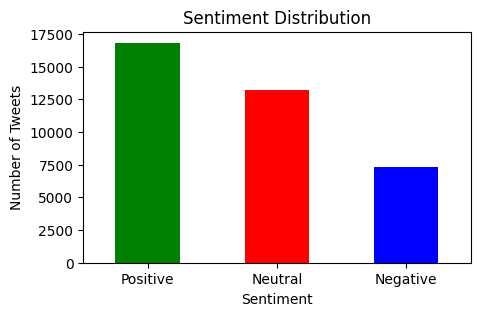

In [94]:
plt.figure(figsize=(5, 3))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=0)
plt.show()

### Merging Dataset

In [95]:
### grouping by dates and finding the mean sentiment of that day
tweets_dataset['Date'] = pd.to_datetime(tweets_dataset['Date']).dt.date
daily_sentiment = tweets_dataset.groupby('Date')['sentiment_score_vader'].mean().reset_index()
daily_sentiment['Date'] = pd.to_datetime(daily_sentiment['Date'])
daily_sentiment.head()

,Date,sentiment_score_vader
0,2021-09-30,0.191241
1,2021-10-01,0.181012
2,2021-10-02,0.252397
3,2021-10-03,0.245420
4,2021-10-04,0.126960


In [96]:
merged_data = pd.merge( stocks_pricing_df,daily_sentiment, on='Date', how='left')
merged_data.set_index('Date', inplace=True)
merged_data.head()

,Open,High,Low,Close,Adj Close,Volume,Stock Name,year,month,sentiment_score_vader
Date,,,,,,,,,,
2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,2021,9,0.191241
2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA,2021,10,0.181012
2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA,2021,10,0.126960
2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA,2021,10,0.101698
2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA,2021,10,0.210923


In [97]:
# observing on some data 30 days
merged_data_head = merged_data.head(30)

### Finding Correlation Visually between Stock Prices and Sentiments Score

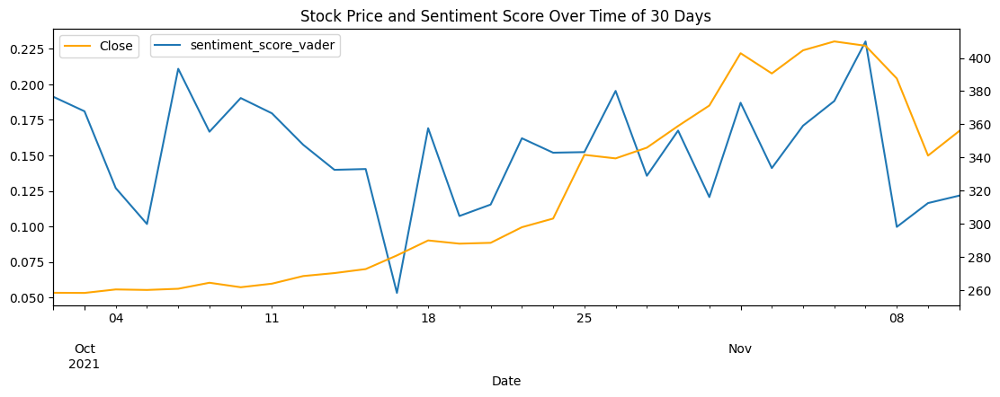

In [98]:
plt.figure(figsize=(13, 4))

# Plot the stock price
ax = merged_data_head["sentiment_score_vader"].plot(legend="Sentiment")
# Adding legend and placing it to the left
plt.legend(loc='center left', bbox_to_anchor=(0.1, 0.94))
ax2 = ax.twinx()
merged_data_head["Close"].plot(ax=ax2, color="orange", legend="Closing Price")
plt.title('Stock Price and Sentiment Score Over Time of 30 Days')
plt.show()

Observations:

1. The correlation turned out to be very good. When the sentiments score is less denoting negative behavior in social media the prices are also less and when the sentiments score is increasing denoting positive tweets then the prices of shares are also increasing.

2. Thus we can say that sentiments do play a role in market share price. We will also build model to test this.


### Finding Correlation

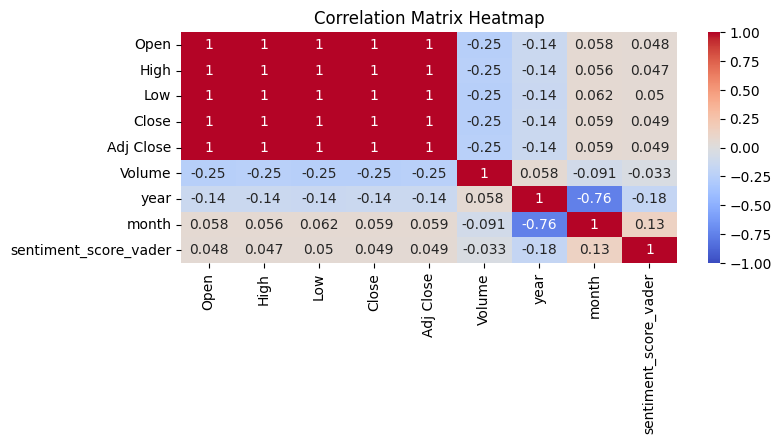

In [99]:
# since stock is Tesla therefore there is no need to keep it in the dataframe
merged_data = merged_data.drop(columns='Stock Name')
correlation_matrix = merged_data.corr()

plt.figure(figsize=(8, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

# Adding titles and labels
plt.title('Correlation Matrix Heatmap')
plt.show()

Observations:

1. We can observe that prices are highly correlated  within each other
2. The opening price is highly correlated with sentiment_score
3. Closing price is also positively correlated with sentiment score.

## Task 5: Classical Machine Learning Models (Price Prediction)

#### Feature Selection





- We will build the model by using sentiment score since it is correlated with closing price.
- We will also include some Technical indicators to understand the pricing and use them as a feature.

  Adding technical indicators
  To help the network understand the bigger picture of the market we add different technical indicators to the training data, such as moving averages, Bollinger bands and RSI, which describe the development of stock price not only for the current day, but for the past week or more.

  MA (7) stands for Moving Average for past 7 days, whereas MA(20) means Moving Average for past 20 days.

  EMA is Exponential Moving average and we can calculate it as:

  EMA_t = Pclose + (EMA_t-1 (100 - P))*

  Bollinger Bands are calculated as:

  middle line: stdev(MA(20))

  upper bound: MA(20) + 2stdev(MA(20))

  lower bound: MA(20) - 2stdev(MA(20))

<b>Calculating Moving Average</b>

In [100]:
merged_data['MA7'] = merged_data['Close'].rolling(window=7).mean()
merged_data['MA20'] = merged_data['Close'].rolling(window=20).mean()

<b>Calculating Bollinger Bands</b>

In [101]:
merged_data['20SD'] = merged_data['Close'].rolling(20).std()
merged_data['upper_band'] = merged_data['MA20'] + (merged_data['20SD'] * 2)
merged_data['lower_band'] = merged_data['MA20'] - (merged_data['20SD'] * 2)
merged_data.dropna(inplace=True)
merged_data_head = merged_data.head(30)

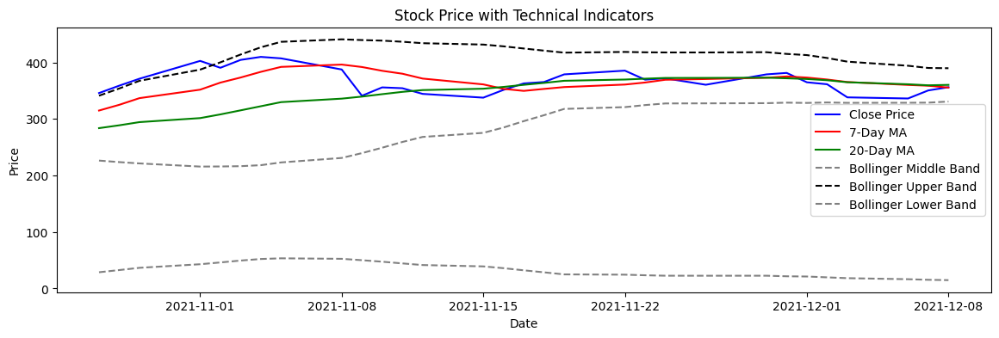

In [102]:
plt.figure(figsize=(14, 4))

# Plot closing price
plt.plot(merged_data_head.index, merged_data_head['Close'], label='Close Price', color='blue')

# Plot Moving Averages
plt.plot(merged_data_head.index, merged_data_head['MA7'], label='7-Day MA', color='red')
plt.plot(merged_data_head.index, merged_data_head['MA20'], label='20-Day MA', color='green')

# Plot Bollinger Bands
plt.plot(merged_data_head.index, merged_data_head['20SD'], label='Bollinger Middle Band', linestyle='--', color='grey')
plt.plot(merged_data_head.index, merged_data_head['upper_band'], label='Bollinger Upper Band', linestyle='--', color='black')
plt.plot(merged_data_head.index, merged_data_head['lower_band'], label='Bollinger Lower Band', linestyle='--', color='grey')

# Add legend
plt.title('Stock Price with Technical Indicators')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

<b>Creating Final Features and Target by using previous sentiment and previous Closing Price</b>

In [103]:
merged_data['prev_close'] = merged_data['Close'].shift(1)
merged_data['prev_sentiment'] = merged_data['sentiment_score_vader'].shift(1)
merged_data.dropna(inplace=True)
merged_data.head()

,Open,High,Low,Close,Adj Close,Volume,year,month,sentiment_score_vader,MA7,MA20,20SD,upper_band,lower_band,prev_close,prev_sentiment
Date,,,,,,,,,,,,,,,,
2021-10-28,356.103333,360.333344,351.399994,359.013336,359.013336,81639600,2021,10,0.167426,325.127141,288.855501,32.580099,354.015698,223.695304,345.953339,0.135632
2021-10-29,360.619995,371.736664,357.736664,371.333344,371.333344,89755200,2021,10,0.120630,336.946189,294.501834,36.566908,367.635649,221.368019,359.013336,0.167426
2021-11-01,381.666656,403.250000,372.886658,402.863342,402.863342,168146100,2021,11,0.187028,351.926666,301.619501,42.906989,387.433479,215.805523,371.333344,0.120630
2021-11-02,386.453339,402.863342,382.000000,390.666656,390.666656,128213400,2021,11,0.141043,364.418095,308.143001,46.078655,400.300312,215.985690,402.863342,0.187028
2021-11-03,392.443329,405.130005,384.206665,404.619995,404.619995,103885500,2021,11,0.170885,373.418095,315.328168,49.410503,414.149173,216.507162,390.666656,0.141043


#### Model Traning using all features and sentiment scores

In [104]:
features = ['Open', 'High', 'Low', 'MA7', "MA20", '20SD', 'upper_band', 'lower_band', 'prev_close', 'prev_sentiment']
target = ['Close']
X = merged_data[features]
y = merged_data[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

#Normalize Data
X_scaler = MinMaxScaler()
y_scaler = MinMaxScaler()

X_train_sc = X_scaler.fit_transform(X_train)
y_train_sc = y_scaler.fit_transform(y_train)
X_test_sc = X_scaler.transform(X_test)
y_test_sc = y_scaler.transform(y_test)

In [132]:
# Evaluation Table Method taken from Class Notes
results = pd.DataFrame()
def add_eval(results, algorithm, y_train, y_train_pred , y_test, y_test_pred):
    for dataset, actual, predicted in zip(("train","test"), (y_train, y_test), (y_train_pred, y_test_pred)):
        results= pd.concat([results, pd.DataFrame([{
            "algorithm": algorithm,
            "dataset": dataset,
            "MSE": mse(actual, predicted),
            "RMSE": math.sqrt(mse(actual, predicted)),
            "MAE": mean_absolute_error(actual, predicted),
            }])], ignore_index=True)
    return results

In [133]:
#using default settings
model_lr = LinearRegression()
model_lr.fit(X_train_sc, y_train_sc)

#predicitng
y_pred_train = model_lr.predict(X_train_sc)
y_pred_test = model_lr.predict(X_test_sc)

#Evalutation
results = add_eval(results, "Linear Regression",
                   y_train_sc, y_pred_train,
                   y_test_sc, y_pred_test)
#Displaying Results
results.head()

,algorithm,dataset,MSE,RMSE,MAE
0,Linear Regression,train,0.000009,0.003068,0.001907
1,Linear Regression,test,0.000012,0.003437,0.002196


<b>Observations:</b>

1. The error is very less on the model showing very good results.
2. Even on test dataset the error score is less.

#### Model creation using all features except sentiment feature

In [134]:
features_specific = ['Open', 'High', 'Low', 'MA7', "MA20", '20SD', 'upper_band', 'lower_band', 'prev_close']
X_specifc = merged_data[features_specific]


# Split the data into training and testing sets
X_train_specific, X_test_specific, y_train_specific, y_test_specific = train_test_split(X_specifc, y, test_size=0.2, shuffle=False)

#Normalizing
X_train_specific = X_scaler.fit_transform(X_train_specific)
y_train_specific = y_scaler.fit_transform(y_train_specific)
X_test_specific = X_scaler.transform(X_test_specific)
y_test_specific = y_scaler.transform(y_test_specific)

model_lr_specific = LinearRegression()
model_lr_specific.fit(X_train_specific, y_train_specific)

y_pred_train_specific = model_lr_specific.predict(X_train_specific)
y_pred_test_specific = model_lr_specific.predict(X_test_specific)

#Evalutation
results = add_eval(results, "Linear Regression Without Sentiments",
                   y_train_specific, y_pred_train_specific,
                   y_test_specific, y_pred_test_specific)
#Displaying Results
results


,algorithm,dataset,MSE,RMSE,MAE
0,Linear Regression,train,0.000009,0.003068,0.001907
1,Linear Regression,test,0.000012,0.003437,0.002196
2,Linear Regression Without Sentiments,train,0.000009,0.003073,0.001909
3,Linear Regression Without Sentiments,test,0.000012,0.003442,0.002198


Observations:

1. With using technical indicators and not using the sentiments the model has shown error.

2. This can show that sentiments has played a role in building good model

### Model Traning without using  Technical Indicators and only using sentiments

In [135]:
features_sent = ['Open', 'High', 'Low', 'prev_close', 'prev_sentiment']
X_sent = merged_data[features_sent]


# Split the data into training and testing sets
X_train_sent, X_test_sent, y_train_sent, y_test_sent = train_test_split(X_sent, y, test_size=0.2, shuffle=False)

#Normalizing
X_train_sent = X_scaler.fit_transform(X_train_sent)
y_train_sent = y_scaler.fit_transform(y_train_sent)
X_test_sent = X_scaler.transform(X_test_sent)
y_test_sent = y_scaler.transform(y_test_sent)

model_lr_sent = LinearRegression()
model_lr_sent.fit(X_train_sent, y_train_sent)

y_pred_train_sent = model_lr_sent.predict(X_train_sent)
y_pred_test_sent = model_lr_sent.predict(X_test_sent)

#Evalutation
results = add_eval(results, "Linear Regression with Sentiments",
                   y_train_sent, y_pred_train_sent,
                   y_test_sent, y_pred_test_sent)
#Displaying Results
results

,algorithm,dataset,MSE,RMSE,MAE
0,Linear Regression,train,0.000009,0.003068,0.001907
1,Linear Regression,test,0.000012,0.003437,0.002196
2,Linear Regression Without Sentiments,train,0.000009,0.003073,0.001909
3,Linear Regression Without Sentiments,test,0.000012,0.003442,0.002198
4,Linear Regression with Sentiments,train,0.000009,0.003070,0.001906
5,Linear Regression with Sentiments,test,0.000012,0.003432,0.002181


<b>Observations:</b>

1. Just using sentiments we got much more good accuracy and less accuracy on test daa set.

2. This proves how sentiments plays an important role.

<b> Visualization</b>

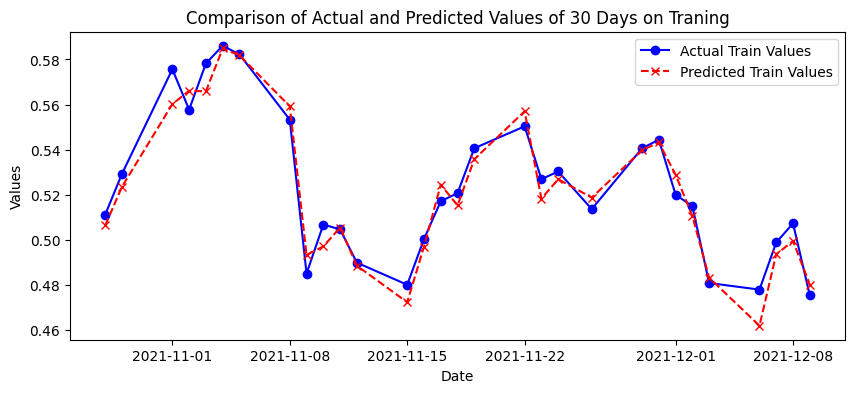

In [115]:
plt.figure(figsize=(10, 4))

plt.plot(X_train.head(30).index, y_train_sc[:30], label='Actual Train Values', color='blue', marker='o')
plt.plot(X_train.head(30).index, y_pred_train[:30], label='Predicted Train Values', color='red', linestyle='--', marker='x')
plt.title('Comparison of Actual and Predicted Values of 30 Days on Traning')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

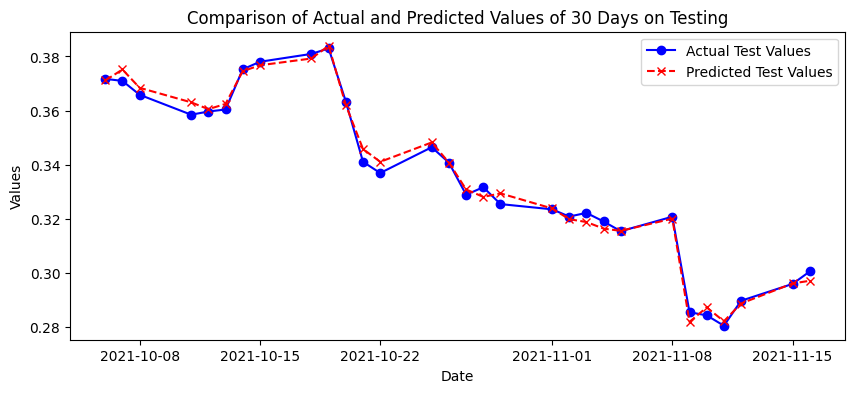

In [116]:
plt.figure(figsize=(10, 4))

plt.plot(X_test.head(30).index, y_test_sc[:30], label='Actual Test Values', color='blue', marker='o')
plt.plot(X_test.head(30).index, y_pred_test[:30], label='Predicted Test Values', color='red', linestyle='--', marker='x')
plt.title('Comparison of Actual and Predicted Values of 30 Days on Testing')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

### Fine Tuning Hyper Parameters in Ridge Regression Model

In [136]:
from sklearn.linear_model import Ridge
ridge = Ridge()

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100]  # Regularization strength
}

#Using Grid search CV
grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit GridSearchCV to the data
grid_search.fit(X_train_sc, y_train_sc)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = -grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Cross-Validation MSE:", best_score)



Best Parameters: {'alpha': 0.01}
Best Cross-Validation MSE: 1.0204928932095863e-05


<b>Evaluating the Model</b>

In [137]:
# Train the model with the best parameters on the entire training set
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred_test_grid = best_model.predict(X_test_sc)

y_pred_train_grid = best_model.predict(X_train_sc)

# Evaluate the model
results = add_eval(results, "Ridge Regression Fine Tuned",
                   y_train_sc, y_pred_train_grid,
                   y_test_sc, y_pred_test_grid)
#Displaying Results
results

,algorithm,dataset,MSE,RMSE,MAE
0,Linear Regression,train,0.000009,0.003068,0.001907
1,Linear Regression,test,0.000012,0.003437,0.002196
2,Linear Regression Without Sentiments,train,0.000009,0.003073,0.001909
3,Linear Regression Without Sentiments,test,0.000012,0.003442,0.002198
4,Linear Regression with Sentiments,train,0.000009,0.003070,0.001906
5,Linear Regression with Sentiments,test,0.000012,0.003432,0.002181
6,Ridge Regression Fine Tuned,train,0.000010,0.003137,0.001994
7,Ridge Regression Fine Tuned,test,0.000012,0.003508,0.002283


Observations:

1. Linear Regression has surpassed Ridge Linear Regression

## Task 6:  Classical Machine Learning Models (Finding Trends in Market using sentiments)

Creating Features for Predicting Trend in Market:

0 : Denoting that tomorrow price is less than today price thus market is in down side or downward slope.

1: Denoting that tomorrow price is higher than today price thus market is in up side or upward slope.

In [144]:
# Tomorrow:price
merged_data['Tomorrow'] = merged_data['Close'].shift(-1)

# Generating Target
merged_data['Target'] = (merged_data['Tomorrow'] > merged_data['Close'] ).astype(int)

merged_data.dropna(inplace = True)

merged_data.head()

,Open,High,Low,Close,Adj Close,Volume,year,month,sentiment_score_vader,MA7,MA20,20SD,upper_band,lower_band,prev_close,prev_sentiment,Tomorrow,Target
Date,,,,,,,,,,,,,,,,,,
2021-10-28,356.103333,360.333344,351.399994,359.013336,359.013336,81639600,2021,10,0.167426,325.127141,288.855501,32.580099,354.015698,223.695304,345.953339,0.135632,371.333344,1
2021-10-29,360.619995,371.736664,357.736664,371.333344,371.333344,89755200,2021,10,0.120630,336.946189,294.501834,36.566908,367.635649,221.368019,359.013336,0.167426,402.863342,1
2021-11-01,381.666656,403.250000,372.886658,402.863342,402.863342,168146100,2021,11,0.187028,351.926666,301.619501,42.906989,387.433479,215.805523,371.333344,0.120630,390.666656,0
2021-11-02,386.453339,402.863342,382.000000,390.666656,390.666656,128213400,2021,11,0.141043,364.418095,308.143001,46.078655,400.300312,215.985690,402.863342,0.187028,404.619995,1
2021-11-03,392.443329,405.130005,384.206665,404.619995,404.619995,103885500,2021,11,0.170885,373.418095,315.328168,49.410503,414.149173,216.507162,390.666656,0.141043,409.970001,1


### Model traning using all features and sentiment score

In [155]:
feature_trend = ['Close', 'High', 'Low', 'MA7', "MA20", '20SD', 'upper_band', 'lower_band', 'sentiment_score_vader']
X_trend = merged_data[feature_trend]
y_trend = merged_data['Target']

# Split the data
X_train_trend, X_test_trend, y_train_trend, y_test_trend = train_test_split(X_trend, y_trend, test_size=0.2, random_state=42)

#Normalizing
X_scaler = MinMaxScaler()
X_train_sc_trend = X_scaler.fit_transform(X_train_trend)
X_test_sc_trend = X_scaler.transform(X_test_trend)


In [157]:
model_clf = RandomForestClassifier(n_estimators=100, random_state=42)
model_clf.fit(X_train_sc_trend, y_train_trend)

# Make predictions on the test set
y_pred_test_trend = model_clf.predict(X_test_sc_trend)

y_pred_train_trend = model_clf.predict(X_train_sc_trend)

# Calculate accuracy
accuracy_test = accuracy_score(y_test_trend, y_pred_test_trend)
print(f'Accuracy Testing Dataset: {accuracy_test:.2f}')

# Calculate accuracy training
accuracy_train = accuracy_score(y_train_trend, y_pred_train_trend)
print(f'Accuracy Training Dataset: {accuracy_train:.2f}')


Accuracy Testing Dataset: 0.54
Accuracy Training Dataset: 1.00


<b>Visualization</b>

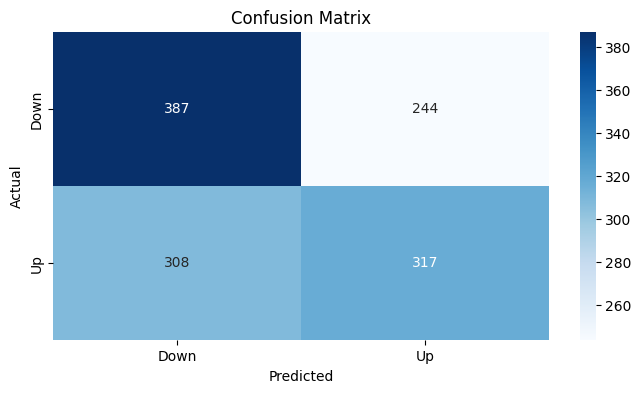

In [143]:
# Print confusion matrix
cm = confusion_matrix(y_test_trend, y_pred_test_trend)
plt.figure(figsize=(8, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Observations:

1. On test dataset, the classifier has not resulted in accurate results with accuracy on 56%

### Model Training using all features except using sentiment feature

In [158]:
feature_trend = ['Close', 'High', 'Low', 'MA7', "MA20", '20SD', 'upper_band', 'lower_band']
X_trend = merged_data[feature_trend]
y_trend = merged_data['Target']

# Split the data
X_train_trend, X_test_trend, y_train_trend, y_test_trend = train_test_split(X_trend, y_trend, test_size=0.2, random_state=42)

#Normalizing
X_scaler = MinMaxScaler()
X_train_sc_trend = X_scaler.fit_transform(X_train_trend)
X_test_sc_trend = X_scaler.transform(X_test_trend)

#Evaluating
model_clf = RandomForestClassifier(n_estimators=100, random_state=42)
model_clf.fit(X_train_sc_trend, y_train_trend)

# Make predictions on the test set
y_pred_test_trend = model_clf.predict(X_test_sc_trend)

y_pred_train_trend = model_clf.predict(X_train_sc_trend)

# Calculate accuracy
accuracy_test = accuracy_score(y_test_trend, y_pred_test_trend)
print(f'Accuracy Testing Dataset without sentiments: {accuracy_test:.2f}')

# Calculate accuracy training
accuracy_train = accuracy_score(y_train_trend, y_pred_train_trend)
print(f'Accuracy Training Dataset without sentiments: {accuracy_train:.2f}')

Accuracy Testing Dataset without sentiments: 0.54
Accuracy Training Dataset without sentiments: 1.00


Observations:

1. Without sentiments score usage also, there is no change in accuracy of model

### Fine Tuning Hyper Parameters in Random Forest classifier

In [163]:
feature_trend = ['Close', 'High', 'Low', 'MA7', "MA20", '20SD', 'upper_band', 'lower_band','sentiment_score_vader']
X_trend = merged_data[feature_trend]
y_trend = merged_data['Target']

# Split the data
X_train_trend, X_test_trend, y_train_trend, y_test_trend = train_test_split(X_trend, y_trend, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [100, 200],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [10, 20],
    'min_samples_leaf': [ 2, 4],
}

rf = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

grid_search.fit(X_train_trend, y_train_trend)

print(f"Best parameters: {grid_search.best_params_}")

best_rf = grid_search.best_estimator_

y_pred = best_rf.predict(X_test_trend)
print(f"Accuracy: {accuracy_score(y_test_trend, y_pred)}")

print(f"Classification Report:\n{classification_report(y_test_trend, y_pred)}")

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'n_estimators': 200}
Accuracy: 0.5820063694267515
Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.71      0.64       653
           1       0.59      0.44      0.50       603

    accuracy                           0.58      1256
   macro avg       0.58      0.58      0.57      1256
weighted avg       0.58      0.58      0.57      1256



### Model Saving

Saving best Prediction and Classification Model

In [165]:
import pickle

with open('market_trend_classify_model.pkl', 'wb') as file:
    pickle.dump(best_rf, file)


with open('price_prediction_model.pkl', 'wb') as file:
     pickle.dump(model_lr_sent, file)


## Task 7: Results Interpretation

1. We have done the sentiment analysis over tweets based on share market and have developed two models one for prediction and one for classification.
2. For Prediction linear model has turned out to be very accurate with sentiment score and we have also saved the model
3. For Classification fine tuning was required to reach to higher accuracy with which we reached an accuracy of 58%.
4. Results have shown that sentiments has a effect on the Share Market Prices and trends.
5. These trends can be treated as up or down market, which can further help the investor to look into the future market situation. Using classfication model such as Random Forest Classifier we found out the prediction of market up or down to be 60%.
6. The error meterics taken into account were MSE, RMSE and MAE.
7. By plotting the correlation graph of market price and sentiment score, it was visually analyzed that they matched the each other at some level. We can correlate this with our theoretical knowledge of knowing that if news or comments are good there is a promise scope in market which then makes the share price to reach more high value.

### Insights Gained

1. Got the knowledge about share market technical indicators.
2. There can be several ways to solve the Text Pre processing but certainly we can achieve higher accuracy.
3. Transformers model utilized much time during the process, GPU is a must reuqirement for large dataset

## Task 8: Conclusion and Future Work

### Limitations

1. I have came across two datasets, due to large dataset size and processing speed slow I have to change my dataset completely. So there is an issue when we want large dataset to build accurate model, but NLP techniques take much time when you don't have GPU, therefore I need to drop that in between and move with a smaller dataset which was again bigger to compute. 

2. This project does not include sentiments analysis with transformers due to Computation issue, but a decription is mentioned about the pipeline.

### Citation 

1. Chatgpt for good code 
2. Hugging face : https://huggingface.co/models 
3. Some models of hugging face that I have researched : https://huggingface.co/ahmedrachid/FinancialBERT-Sentiment-Analysis
https://huggingface.co/finiteautomata/bertweet-base-sentiment-analysis 
https://huggingface.co/mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis
4. https://medium.com/@rslavanyageetha/vader-a-comprehensive-guide-to-sentiment-analysis-in-python-c4f1868b0d2e
5. One of the alternative for Vader: Textblob https://medium.com/@khalidassalafy/textblob-a-simple-library-for-natural-language-processing-nlp-81b993e252b0
6. Course Modules 


### Future Work

1. Different Text preprocessing methods can be used.
2. Different Machine Learning Algorithms can be used.
3. Since share market plays an important role for investors thus knowledge with the experts is required.
4. By using this model we can test the future trend and see how it works.
5. This project can be extended more, like deploying a website and in real time fetching information
6. Differnt Technical Indicators can be used to predict.
7. Several Text analysis like emotion analysis can also be performed.
8. More data with computing power can be used to build more accurate model.
9. Use of Hugging Face Trasnformers can be done

<i>End of File</i>